<a href="https://colab.research.google.com/github/aryan465/ml_projects/blob/main/svm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CS503 Lab-4 : Working with Support Vector Machines

---

Total Points: **100**

---
**Overview**

---


**1. Implementing a MultiClass Linear SVM Using Hinge Loss and Gradient Descent for**   (70 Points)

    1.1 Classifying a Linearly Separable 2D Toy Dataset (4 Classes)
    1.2 Classifying the Cifar10 Image Dataset           (10 Classes)

**2. SVM Using Sklearn Package for**  (30 Points)

    1.1 Classifying a Non-Linearly Separable 2D Toy Dataset (2 Classes)


In [ ]:
## Please Fill In Your Name, ID and EMAIL below:

student_name = "Aryan Anand"
student_id   = "2019meb1244"
student_email= "2019meb1244@iitrpr.ac.in"


**Instructions for Running in Google Colab**

---
* To run the lab on colab, upload the extracted folder to your drive. 
* Then right click 'lab4_svm.ipynb' in the uploaded drive folder and chose open with google colab.
* Provide the path to the uploaded directory in the cell below.

(You can use the given code block below without changing the path if you have uploaded the folder to the root directory of your drive)

---

In [ ]:

import os
from IPython.display import Image
if 'google.colab' in str(get_ipython()):
  root_dir = "/gdrive/MyDrive"
  lab_dir  = "CS503_Lab4"
  
  working_dir = os.path.join(root_dir,lab_dir)
  from google.colab import drive
  drive.mount('/gdrive',force_remount=True)
  
  if("lab4_svm.ipynb" in os.listdir(working_dir)):
    print("Successfully Loaded Lab Directory")
    os.chdir(working_dir)
  else:
    print("Failed to Load the Directory from "+working_dir+".\nPlease check the given 'lab_dir' is correct and rerun.")
    

Mounted at /gdrive
Successfully Loaded Lab Directory


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


----
**Part-1 : Implementing SVM Using Gradient Descent** (70 Points)
----
In the first section, we will implement a Linear SVM using gradient descent and the Hinge Loss. Detailed notes about the loss function to be implementd and its gradient computation is given below. Please take time to go through, understand and derive the gradients by yourself before starting the implementation. A pdf containing the same is also provided in the root directory of the lab.

In [ ]:
import numpy as np
import os
import pickle 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from utils import *
import tensorflow as tf
from sklearn.datasets import make_blobs,make_moons
import matplotlib.pyplot as plt 
from matplotlib.animation import FuncAnimation
import imageio
from IPython.display import Image
import sys

In [ ]:
np.random.seed(0)
output_dir = "/content/drive/MyDrive/CS503_Lab4/output"
os.makedirs(output_dir,exist_ok=True)

**Code Organization**

Overall, we organize the code in the form of the following three classes:

* 1. LinearSVM:

A generic class that defines the overall structure for defining and training an SVM. You are not required to make any changes to this class. But go through the code carefully and understand the funtionality of each class variable and member function. It has unimplemented interfaces that has to be defined by the concrete classes that inherits LinearSVM.
         
* 2. ToyClassifier:
         
         
This class inherits the LinearSVM class and will be used for classification of a 2D toy dataset. This is the main class where you will have to put in your code to define the loss, gradient, etc as detailed in the respective areas.
         
* 3. ImageClassifier:
         
         
This class inherits the ToyClassifier class and hence its implemented gradients and losses. However this will be used for training on an Image dataset. You are required to fill in the code for initializing the model weights and visualizing the learned weights for each class. 
         
***You are requested to go through the code and understand the overall structure before filling in your snippets.*** 

* Make sure that the member variables of the class as defined in the __init__ function is utilized appropriately wherever necessary as per their functionality in your code snippets.

 

In [ ]:
class LinearSVM():
    def __init__(self,x_dim=2,n_class=3,delta=1,lamda=0.1,lr=1e-3,batch_size=128,n_iter=2000,log_freq=10):
        self.x_dim      = x_dim          # Feature dimension
        self.n_class    = n_class        # No. of Classes
        self.delta      = delta          # Margin by which the scores of correct classes should be higher than incorrect ones
        self.lamda      = lamda          # The regularization hyperparameter
        self.lr         = lr             # The learning rate
        self.batch_size = batch_size     # Batch Size
        self.n_iter     = n_iter         # No. of training iterations
        self.log_freq   = log_freq       # Frequency of logging the progress
        self.history    = {
                        "loss":{"Training":[],"Validation":[],"Testing":[]},
                        "accuracy":{"Training":[],"Validation":[],"Testing":[]},
                        "weights":[],
                        "decision_surface":[]
                        }
        self.W          = self.initialize_weight()
        self.dataset    = self.load_dataset()
        self.train_dataset, self.validation_dataset, self.test_dataset = self.split_dataset(self.dataset)
        
        self.student_name = student_name
        self.student_id   = student_id
        self.student_email=student_email
        
    def split_dataset(self,dataset):
        X_train, X_test, y_train, y_test = train_test_split(dataset[0],dataset[1],test_size=0.33,random_state=23)
        X_test, X_val, y_test, y_val     = train_test_split(X_test,y_test, test_size=0.33,random_state=23)
        return (X_train,y_train),(X_val,y_val),(X_test,y_test)

    def train(self):
        X,Y = self.train_dataset
        n_data = X.shape[0]
        for iteration in range(1,self.n_iter+1):
            batch_idx = np.random.choice(range(0,n_data),self.batch_size)
            x_batch   = X[batch_idx]
            y_batch   = Y[batch_idx]
            loss      = self.loss(x_batch,y_batch)
            gradient  = self.gradient(x_batch,y_batch)
            y_pred    = self.predict(x_batch)
            accuracy  = self.accuracy(y_pred,y_batch)
            self.update_weight(gradient)
            
            if(iteration%self.log_freq==0):
                self.log("Training",iteration,loss,accuracy)
                validation_loss,validation_acc = self.validate()
                self.log("Validation",iteration,validation_loss,validation_acc)
                self.history["weights"].append(self.W)
                self.history["decision_surface"].append(self.visualize_weights())

        test_loss,test_acc = self.test()
        self.log("Testing",iteration,validation_loss,validation_acc)
        
    def validate(self):
        X,Y = self.validation_dataset
        n_data = X.shape[0]
        batch_idx = np.random.choice(range(0,n_data),self.batch_size)
        x_batch   = X[batch_idx]
        y_batch   = Y[batch_idx]
        loss      = self.loss(x_batch,y_batch)
        y_pred    = self.predict(x_batch)
        accuracy  = self.accuracy(y_pred,y_batch)
        return loss,accuracy

    def test(self):
        X,Y = self.test_dataset
        n_data = X.shape[0]
        accuracies = []
        losses     = []
        for iteration in range(0,n_data//self.batch_size):
            batch_idx = range(iteration*self.batch_size,(iteration+1)*self.batch_size)
            x_batch   = X[batch_idx]
            y_batch   = Y[batch_idx]
            loss      = self.loss(x_batch,y_batch)
            y_pred    = self.predict(x_batch)
            accuracy  = self.accuracy(y_pred,y_batch)
            accuracies.append(accuracy)
            losses.append(loss)
        return np.mean(losses), np.mean(accuracies)    
        
    def log(self,mode,iteration,loss,accuracy):
        print("--"*40)
        print("{:10s} | Iter : {:5f}| Loss : {:5f}| Accuracy: {:5f}".format(mode,iteration,loss,accuracy))
        self.history["loss"][mode].append(loss)
        self.history["accuracy"][mode].append(accuracy)


    def print_observations(self):
        self.collect_observations()
        print(self.observations)

    def check_gradients(self):
        x,y = self.train_dataset
        x = x[:128]
        y = y[:128]    
        curr_W = self.W
        def eval_grad_loss(W):
            self.W = W
            return self.loss(x,y)
        numeric_gradient  = eval_numerical_gradient(eval_grad_loss,self.initialize_weight())
        analytic_gradient = self.gradient(x,y)
        numeric_gradient  = numeric_gradient.reshape([-1,])
        analytic_gradient = analytic_gradient.reshape([-1,])
        relative_error = np.average(np.abs(numeric_gradient - analytic_gradient) / numeric_gradient, axis=0)
        print(" Numerical & Analytic Gradient Relative Error : ",relative_error)
        self.W = curr_W

    def print_observations(self):
        self.collect_observations()
        print(self.observations)

    def initialize_weight(self):
        raise NotImplementedError
        
    def predict(self,x,W=None):
        raise NotImplementedError
    
    def accuracy(self,Y_pred,Y_true):
        return accuracy_score(Y_pred,Y_true)
    
    def loss(self,X,Y):
        raise NotImplementedError
    
    def gradient(self,X,Y):
        raise NotImplementedError
    
    def update_weight(self,gradient):
        raise NotImplementedError
                
    def collect_observations(self):
        raise NotImplementedError

----
**1.1 Overview of Point Distribution For The Parts of ToyClassifier to be Completed**

----
    
    1. initialize_weight() : 5 Points
    2. loss()              : 10 Points
    3. gradient()          : 10 Points
    4. update_weight()     : 5 Points
    5. predict()           : 5 Points
    6. observations        : 5 Points
   
    7. Tuning hyperparameters to achieve good performance : 10 Points
    
    Total : 50 Points


Sample Output



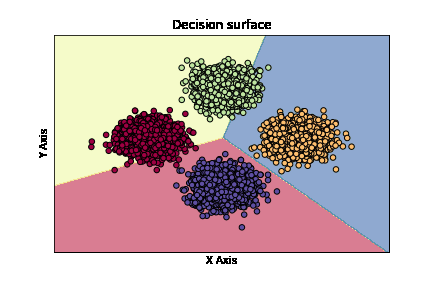

In [ ]:
print("\nSample Output\n")
with open('/content/drive/MyDrive/CS503_Lab4/files/sample_output/svm_toy.gif','rb') as f:
    display(Image(data=f.read()))

In [ ]:

class ToyClassifier(LinearSVM):
    def __init__(self, **kwargs):
        super(ToyClassifier,self).__init__(**kwargs)
    
    def initialize_weight(self):
        """
        Function to initialize the parameters (W) of the model.
        Input   : None
        Returns : A numpy array of dimension equal to the weight dimension (feature_dim x #classes)
                  The values can be drawn from any distribution of your choice - normal distribution,
                  uniform distribution, etc. Try initialization using different distributions and pick the
                  best performing.
        
        (5 Points)
        """
        ### BEGIN - Enter your code below ###
        
        weights = np.random.normal(loc=0,scale=1.0,size=(self.x_dim,self.n_class))
        return weights

        ### END ###


    def load_dataset(self):
        """
        Function to load the dataset.
        Input   : None
        Returns : Data samples (X) and their corresponding labels (y) 
        """
        X,y =  make_blobs(100000,cluster_std=0.40,centers=[(-2,0),(2,0),(0,2),(0,-2)])
        return X,y 

    def visualize_weights(self):
        """
        Function to visualize the learned decision surface.
        Input   : None
        Returns : The plotted decision surface
        """
        X,y = self.train_dataset
        X = X[:5000]
        y = y[:5000]
        fig, ax = plt.subplots()
        title = ('Decision surface')
        X0, X1 = X[:, 0], X[:, 1]
        xx, yy = make_meshgrid(X0, X1)
        plot_contours(ax, self, xx, yy, cmap=plt.cm.Spectral, alpha=0.6)
        ax.scatter(X0, X1, c=y, cmap=plt.cm.Spectral, s=30, edgecolors='k')
        ax.set_ylabel('Y Axis')
        ax.set_xlabel('X Axis')
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(title)
        fig.canvas.draw()
        image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        image_from_plot = image_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        plt.close()
        return image_from_plot

    
    def loss(self,X,y):
        """
        Function to compute the loss. (Refer to the notes for loss definition)
        Input   : Batch of data samples (X) and its labels (y)
        Returns : The SVM loss on the inputed data batch. (scalar)
        
        (10 Points)
        """
        ### BEGIN - Enter your code below ###
        loss = 0
        X = X
        y = y
        W = self.W
        train_num = X.shape[0]
        S = X.dot(W)
        yi_scores = S[np.arange(S.shape[0]),y]
        margins = np.maximum(0, S - np.matrix(yi_scores).T + self.delta)
        margins[np.arange(train_num),y] = 0
        loss = np.mean(np.sum(margins, axis = 1))
        loss += 0.5*(self.lamda)*(np.sum(W*W))

        return loss
        ### END ###
    
    def gradient(self,X,y):
        """
        Function to compute the gradient. (Refer to the notes for gradient computation help)
        Input   : Batch of data samples (X) and its labels (y)
        Returns : The gradient w.r.t the weights (W) for the loss on the inputed data batch. (dim = dim of W)
        
        (10 Points)
        """
        ### BEGIN - Enter your code below ###

        X = X
        y = y
        W = self.W
        del_w = np.zeros(W.shape)
        train_num = X.shape[0]
        S = X.dot(W)
        yi_scores = S[np.arange(S.shape[0]),y]
        margins = np.maximum(0, S - np.matrix(yi_scores).T + self.delta)
        margins[np.arange(train_num),y] = 0

        grad_check = margins
        grad_check[margins>0] = 1
        sum_row = np.sum(grad_check, axis = 1)
        grad_check[np.arange(train_num),y] = -sum_row.T
        del_w = np.dot(X.T, grad_check)

        del_w/= train_num

        del_w += (self.lamda)*W

        return del_w
        
        ### END ###
    

    def update_weight(self,gradient):
        """
        Function to update the weights using the gradient update rule : W = W - learning_rate x gradients.
        Input   : Gradients
        Returns : Nothing.
                  Use the gradient inputed to update the weight matrix (The weight matrix and learning rate are a member variable of the class. See __init__ of LinearSVM for all member variables)
        
        (5 Points)
        """
        ### BEGIN - Enter your code below ###
        self.W -= self.lr*gradient
        
        ### END ###
    

    def predict(self,X):
        """
        Function to predict the target class for the inputed batch of samples the gradient( hint: class having highest score as assigned by the SVM)
        Input   : Batch of data samples (X) (- dim: batch_size x feature_dim)
        Returns : The predicted labels      (- dim: batch_size)
        
        (5 Points)
        """

        S = X.dot(self.W)
        
        pred = np.argmax(S,axis=1)
        
        return pred
        
        ### END ###
    

    def collect_observations(self):
        self.observations = """
        ===============================================================
        <ID> 1.1 2D TOY CLASSIFICATION-GRADIENT BASED LINEAR SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content)
        ---------------------------------------------------------------
        <BEGIN>

        *delta - It is the minimum value by which the score of correct class 
        should be larger than that of incorrect class. A small value of delta 
        will not be able to distinguish the classes accurately, whereas a 
        very high value may even surpass score of the correct class.

        *lamda - It is the regularization parameter used in loss function.
        It takes account of wrong classification by increasing the loss 
        function. Higher lamda means higher loss associated for misclassification.
        Hence, higher lamda means low tolerance for misclassification.

        *lr - It is the learning rate of the algorithm. Very high lr can cause
        oscillations around the minima, whereas very low lr will cause a slow
        convergence.

        *batch_size - It is the number of train datatsets used at a time
        (iteration) while training. 

        *n_iter - It is the number of iterations that the model will train.
        Higher iterations means that the model will train on the given dataset 
        more number of times which results in higher accuracy but on the same
        note increases the total training time.

        *log_freq - It is the number of iterations after which model will 
        return (or save) a report of train results.

        **INFERENCES :-
        The 'ToyClassifier' made using linear SVM is able to classify the 
        given dataset into 4 classes very accurately. A slower lr increases
        the training as well as validation accuracies. Also, higher value 
        of lamda minimises misclassified classes.

        <END>
        ---------------------------------------------------------------   
        
        (5 Points)
                            """



**CODE BLOCKS TO CHECK THE WORKING OF THE IMPLEMENTED FUNCTIONS**

In [ ]:
toy_classifier = ToyClassifier(n_class=4,n_iter=50,log_freq=50,delta=10)
X,Y       = toy_classifier.train_dataset
x_batch   = X[:5]
y_batch   = Y[:5]


print("\n==>Checking Working of Initialize Weight Function")
W      = toy_classifier.initialize_weight()
print("----- Running Successfull: Weight Dimensionn : ",W.shape) 

print("\n==>Checking Working of Loss Function")
loss      = toy_classifier.loss(x_batch,y_batch)
print("----- Running Successfull: Loss Value : ",loss)


print("\n==>Checking Working of Gradient Function")
gradient      = toy_classifier.gradient(x_batch,y_batch)
if(gradient.shape == toy_classifier.W.shape):
    print("----- Running Successfull: Gradient Dim : ",gradient.shape)
else:
    print("----- Error : Gradient Dim Mismatch. Dim of Gradient Provided :  ",gradient.shape," Weight Dim : ",toy_classifier.W.shape)
toy_classifier.check_gradients()

print("\n==>Checking Working of Predict Function")
y_pred    = toy_classifier.predict(x_batch)
if(y_pred.shape == y_batch.shape):
    print("----- Running Successfull: y_pred : ",y_pred, "y_true : ",y_batch)
else:
    print("----- Error: Shape Mismatch - y_pred : ",y_pred, "y_true : ",y_batch)


==>Checking Working of Initialize Weight Function
----- Running Successfull: Weight Dimensionn :  (2, 4)

==>Checking Working of Loss Function
----- Running Successfull: Loss Value :  33.26175572620808

==>Checking Working of Gradient Function
----- Running Successfull: Gradient Dim :  (2, 4)
 Numerical & Analytic Gradient Relative Error :  [[ 3.22237743e-11 -2.01288830e-11 -2.84679898e-09 -6.83961855e-11
  -1.17382173e-09 -2.33368861e-10 -1.71165344e-10  1.62604286e-11]]

==>Checking Working of Predict Function
----- Running Successfull: y_pred :  [1 1 2 1 2] y_true :  [0 0 1 0 1]


----
**Training And Tuning**

----
Change and Tune the hyperparameter values below till you achieve a very high validation accuracy ~ 99%.
Note that the n_class and x_dim should be 4 and 2 respectively as we have 2D toy data consisting of 4 classes 

(10 Points)

--------------------------------------------------------------------------------
Training   | Iter : 100.000000| Loss : 26.393405| Accuracy: 1.000000
--------------------------------------------------------------------------------
Validation | Iter : 100.000000| Loss : 26.460816| Accuracy: 1.000000
--------------------------------------------------------------------------------
Training   | Iter : 200.000000| Loss : 24.700852| Accuracy: 1.000000
--------------------------------------------------------------------------------
Validation | Iter : 200.000000| Loss : 21.827340| Accuracy: 1.000000
--------------------------------------------------------------------------------
Training   | Iter : 300.000000| Loss : 24.339333| Accuracy: 1.000000
--------------------------------------------------------------------------------
Validation | Iter : 300.000000| Loss : 21.060158| Accuracy: 1.000000
--------------------------------------------------------------------------------
Training   | Iter :

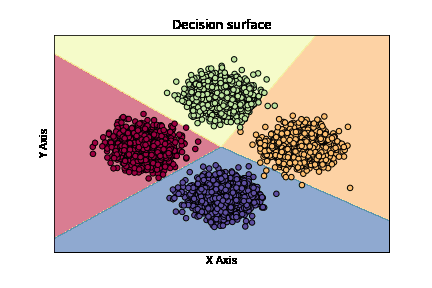

==>Observations:


        <ID> 1.1 2D TOY CLASSIFICATION-GRADIENT BASED LINEAR SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content)
        ---------------------------------------------------------------
        <BEGIN>

        *delta - It is the minimum value by which the score of correct class 
        should be larger than that of incorrect class. A small value of delta 
        will not be able to distinguish the classes accurately, whereas a 
        very high value may even surpass score of the correct class.

        *lamda - It is the regularization parameter used in loss function.
        It takes account of wrong classification by increasing the loss 
        function. Higher lamda means higher loss associated for misclassification.
        Hence, higher lamda means low tolerance for misclassification.

        *lr - It is the le

In [ ]:
### BEGIN - CHANGE/TUNE THE FOLLOWING HYPERPARAMETER VALUES###

delta     = 10
lamda     = 1.5
lr        = 1e-2
batch_size= 2
n_iter    = 5000
log_freq  = 100

### END ###

toy_classifier = ToyClassifier(x_dim=2,n_class=4,delta=delta,lamda=lamda,lr=lr,batch_size=batch_size,n_iter=n_iter,log_freq=log_freq)
toy_classifier.train()
imageio.mimsave('{}/svm_toy.gif'.format(output_dir), toy_classifier.history["decision_surface"])
save(toy_classifier,directory=output_dir)

print("==>Gradient Check:\n")
toy_classifier.check_gradients()

print("\n==>Visualization of Decision Surface Over Training Iterations\n")
with open('{}/svm_toy.gif'.format(output_dir),'rb') as f:
    display(Image(data=f.read()))
    
print("==>Observations:\n")
toy_classifier.print_observations()


----
**1.2 Overview of Point Distribution For The Parts of ImageClassifier to be Completed**

----
    
    1. initialize_weight() : 2.5 Points
    2. visualize_weights() : 5 Points
    3. observations        : 2.5 Points
   
    4. Tuning hyperparameters to achieve good performance : 10 Points
    
    Total : 20 Points


Sample Output



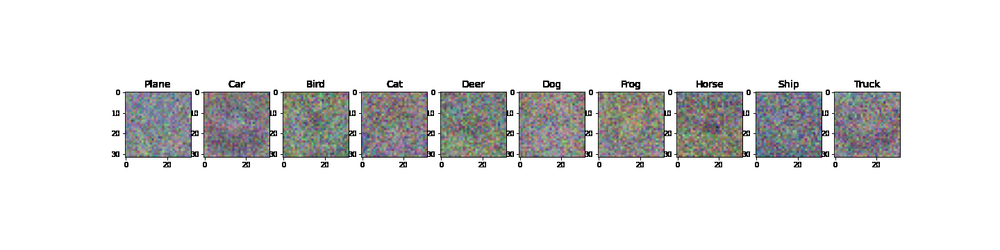

In [ ]:
print("\nSample Output\n")
with open('files/sample_output/svm_image.gif','rb') as f:
    display(Image(data=f.read()))

In [ ]:

class ImageClassifier(ToyClassifier):
    def __init__(self, **kwargs):
        super(ImageClassifier,self).__init__(**kwargs)

    def initialize_weight(self):
        """
        Function to initialize the parameters (W) of the model.
        Input   : None
        Returns : A numpy array of dimension equal to the weight dimension (feature_dim x #classes)
                  The values can be drawn from any distribution of your choice - normal distribution,
                  uniform distribution, etc. Try initialization using different distributions and pick the
                  best performing.
        
        (2.5 Points)
        """
        ### BEGIN - Enter your code below ###
        weights = np.random.normal(loc=0,scale=1.0,size=(self.x_dim,self.n_class))
        
        return weights
        
        ### END ###
    
    def visualize_weights(self):
        """
        Function to visualize the learned parameters (W) of the model.
        Input   : None
        Returns : An image frame for the plotted weights
        
        The cifar10 images are of size 32x32x3 (=3072 pixels) and there are 10 classes. 
        Thus, The weights of the SVM would be of size 3072x10. Thus, for each of the 10 classes we
        have a weight of dimension 3072 (=32x32x3). Since we have a linear SVM, the i-th 32x32x3 weight vector
        can be interpreted as the features that the SVM is learning inorder to distinguish class i from other
        classes. The objective of this function is to visualize each of those weight matrices. You are required 
        to extract the weight vector for each of the class, reshape it to 32x32x3 and plot it as an image along 
        with its class title.  
        
        The list of classes ordered as per their labels is given in the function for your convenience.
        The figure has also been defined as having 10 subplots for each of the classes. You have to plot the weight 
        for the i-th class on the i-th axis (i.e. ax[i]).
        
        PS: Do not call plt.show(). Code for checking the output is given in the following cell.
        
        (5 Points)
        """
        
        classes = ['Plane', 'Car', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
        fig, ax = plt.subplots(1,10,figsize=(20,5))
        
        ### BEGIN - Enter your code below ###
        W = self.W

        for i in range(10):
          W_reshape = (W.T[i].reshape(32,32,3))
          ax[i].title.set_text(classes[i])
          ax[i].imshow(W_reshape)
        ### END ###
    
        fig.canvas.draw()
        image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        image_from_plot = image_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        plt.close()
        return image_from_plot
    
    def load_dataset(self):
        (x_train, y_train), (_, _) = tf.keras.datasets.cifar10.load_data()
        mean_image = np.mean(x_train, axis=0)
        x_train = x_train - mean_image
        x_train = x_train.reshape([x_train.shape[0],-1])
        y_train = y_train.reshape([y_train.shape[0]])
        return (x_train, y_train)

    def clear_dataset(self):
        self.dataset,self.train_dataset, self.validation_dataset, self.test_dataset = None, None, None, None
    
    def collect_observations(self):
        self.observations = """
        ===============================================================
        <ID> 1.2 IMAGE CLASSIFICATION - GRADIENT BASED LINEAR SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content & dashed lines)
        ---------------------------------------------------------------
        <BEGIN>
        
        *delta - It is the minimum value by which the score of correct class 
        should be larger than that of incorrect class. A smaal value of delta 
        will not be able to distinguish the classes accurately, whereas a 
        very high value may even surpass score of the correct class.

        *lamda - It is the regularization parameter used in loss function.
        It takes account of wrong classification by increasing the loss 
        function. Higher lamda means higher loss associated for misclassification.
        Hence, higher lamda means low tolerance for misclassification. 

        *lr - It is the learning rate of the algorithm. Very high lr can cause
        oscillations around the minima, whereas very low lr will cause a slow
        convergence.

        *batch_size - It is the number of train datatsets used at a time
        (iteration) while training. 

        *n_iter - It is the number of iterations that the model will train.
        Higher iterations means that the model will train on the given dataset 
        more number of times which results in higher accuracy but on the same
        note increases the total training time.

        *log_freq - It is the number of iterations after which model will 
        return (or save) a report of train results.

        **INFERENCES :-
        The 'ImageClassifier' is based on linear SVM. But, here we are using 
        a dataset having 10 classes. Therefore, linear classifier is not able
        to build hyperplanes taht are able to classify all 10 classes separately.
        Hence, the accuracies touch a maximum of around 45% but keep on
        fluctuating between 20% - 40% for diffrent iterations

        <END>
        --------------------------------------------------------------- 
        
        (2.5 Points)
                            """


**CODE BLOCKS TO CHECK THE WORKING OF THE IMPLEMENTED FUNCTIONS**

170500096/170498071 [==============================] - 2s 0us/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i


==>Checking Working of Initialize Weight Function
----- Running Successfull: Weight Dimensionn :  (3072, 10)

==>Checking Working of Visualize Weight Function


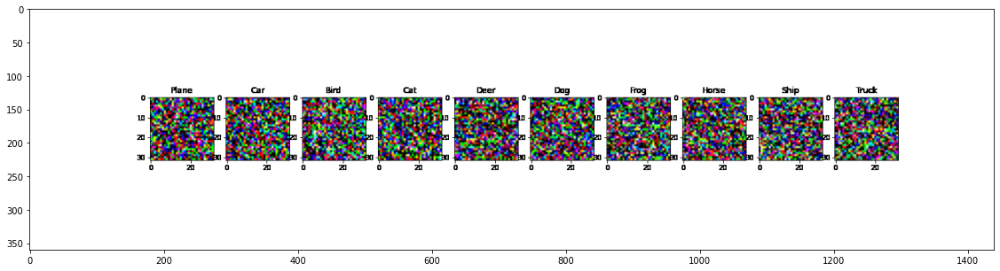

In [ ]:
image_classifier = ImageClassifier(n_class=10,x_dim=3072,n_iter=50,log_freq=50,delta=10)
X,Y       = image_classifier.train_dataset
x_batch   = X[:5]
y_batch   = Y[:5]

print("\n==>Checking Working of Initialize Weight Function")
W      = image_classifier.initialize_weight()
print("----- Running Successfull: Weight Dimensionn : ",W.shape) 

print("\n==>Checking Working of Visualize Weight Function")
image_frame = image_classifier.visualize_weights()
fig,ax = plt.subplots(1,1,figsize=(20,5))
plt.imshow(image_frame)

----
**Training And Tuning**

----

Change and Tune the hyperparameter values below till you achieve a reasonable validation accuracy. Note that 
since there are 10 classes, chance would be at 10% accurate. Since we are using linear SVM to classify images, it is not expected that we get very high accuracy. A validation accuracy close to 40% can be considered good enough.

Note that the n_class and x_dim should be 10 and 3072 (=32x32x3) respectively.

(10 Points)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 500.000000| Loss : 262398.745560| Accuracy: 0.300000
--------------------------------------------------------------------------------
Validation | Iter : 500.000000| Loss : 357097.709933| Accuracy: 0.366667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 1000.000000| Loss : 565052.408249| Accuracy: 0.366667
--------------------------------------------------------------------------------
Validation | Iter : 1000.000000| Loss : 647779.753045| Accuracy: 0.166667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

--------------------------------------------------------------------------------
Training   | Iter : 1500.000000| Loss : 385781.088055| Accuracy: 0.366667
--------------------------------------------------------------------------------
Validation | Iter : 1500.000000| Loss : 347345.778989| Accuracy: 0.266667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 2000.000000| Loss : 402901.973451| Accuracy: 0.333333
--------------------------------------------------------------------------------
Validation | Iter : 2000.000000| Loss : 674159.279930| Accuracy: 0.200000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

--------------------------------------------------------------------------------
Training   | Iter : 2500.000000| Loss : 209046.084119| Accuracy: 0.366667
--------------------------------------------------------------------------------
Validation | Iter : 2500.000000| Loss : 308279.786458| Accuracy: 0.333333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

--------------------------------------------------------------------------------
Training   | Iter : 3000.000000| Loss : 314648.243290| Accuracy: 0.300000
--------------------------------------------------------------------------------
Validation | Iter : 3000.000000| Loss : 440877.878520| Accuracy: 0.233333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 3500.000000| Loss : 390443.729541| Accuracy: 0.233333
--------------------------------------------------------------------------------
Validation | Iter : 3500.000000| Loss : 469282.014751| Accuracy: 0.133333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 4000.000000| Loss : 382891.790542| Accuracy: 0.300000
--------------------------------------------------------------------------------
Validation | Iter : 4000.000000| Loss : 561458.843229| Accuracy: 0.233333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

--------------------------------------------------------------------------------
Training   | Iter : 4500.000000| Loss : 277970.913179| Accuracy: 0.333333
--------------------------------------------------------------------------------
Validation | Iter : 4500.000000| Loss : 187676.356139| Accuracy: 0.400000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Training   | Iter : 5000.000000| Loss : 293268.496865| Accuracy: 0.333333
--------------------------------------------------------------------------------
Validation | Iter : 5000.000000| Loss : 160707.690296| Accuracy: 0.466667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


--------------------------------------------------------------------------------
Testing    | Iter : 5000.000000| Loss : 160707.690296| Accuracy: 0.466667

==>Weight Visualization



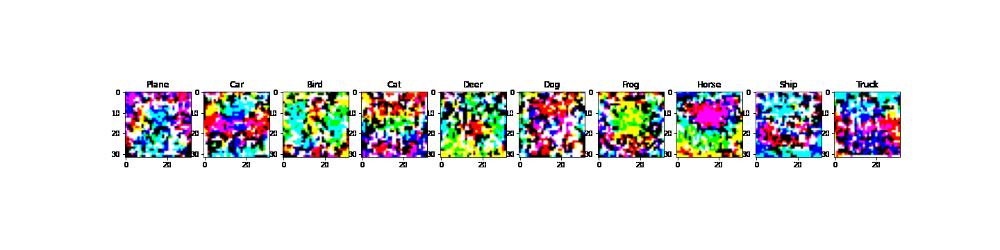

==>Observations:


        <ID> 1.2 IMAGE CLASSIFICATION - GRADIENT BASED LINEAR SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content & dashed lines)
        ---------------------------------------------------------------
        <BEGIN>
        
        *delta - It is the minimum value by which the score of correct class 
        should be larger than that of incorrect class. A smaal value of delta 
        will not be able to distinguish the classes accurately, whereas a 
        very high value may even surpass score of the correct class.

        *lamda - It is the regularization parameter used in loss function.
        It takes account of wrong classification by increasing the loss 
        function. Higher lamda means higher loss associated for misclassification.
        Hence, higher lamda means low tolerance for misclassification. 

 

In [ ]:
### BEGIN - CHANGE/TUNE THE FOLLOWING HYPERPARAMETER VALUES###


delta     = 1e2
lamda     = 1e-3
lr        = 1e-1
batch_size= 30
n_iter    = 5000
log_freq  = 500


### END ###

image_classifier = ImageClassifier(x_dim=3072, n_class=10,delta=delta,lamda=lamda,lr=lr,batch_size=batch_size,n_iter=n_iter,log_freq=log_freq)
image_classifier.train()
image_classifier.clear_dataset()
imageio.mimsave('{}/svm_image.gif'.format(output_dir), image_classifier.history["decision_surface"])
save(image_classifier,directory=output_dir)
                                
print("\n==>Weight Visualization\n")
with open('{}/svm_image.gif'.format(output_dir),'rb') as f:
    display(Image(data=f.read()))

print("==>Observations:\n")
image_classifier.print_observations()

---
**Part-2: Nonlinear SVM Using the Sklearn Package** (30 Points)
---

 * In the first part we implemented a Linear SVM using gradient descent. However, not all datasets are linearly separable. The wide popularity of SVM is due its ability learn complex non linear decision boundaries using kernels. However, gradient computation becomes hard while using kernels. Hence we will use the predefined SVM Classifier from the sklearn package (SVC) which uses the constrained quadratic optimization method (using lagrangian multipliers).

 * We will work with a non-linearly separable 2D toy dataset consisting of 2 Classes.
 

----
 **2.1 Overview of Point Distribution For The Parts of NonLinearSVM to be Completed**
 
 ----
    
    1. build_model()       : 2.5 Points
    2. visualize()         : 12.5 Points
    3. observations        : 5 Points
   
    4. Tuning hyperparameters to achieve good performance : 10 Points
    
    Total : 30 Points


Sample Output



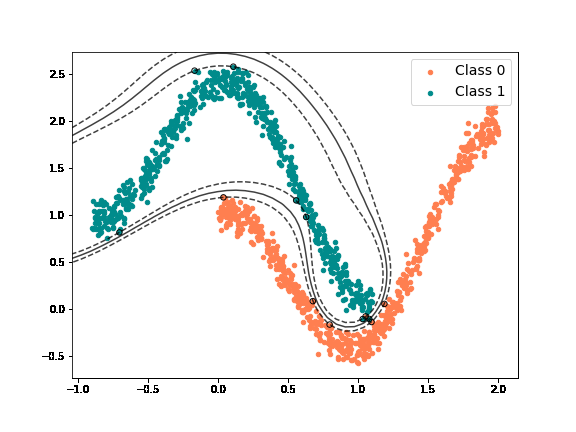

In [ ]:
print("\nSample Output\n")
Image('files/sample_output/svm_nonlinear.png')

In [ ]:
import numpy as np
import os
import pickle 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.datasets import make_moons,make_circles
from utils import *
import matplotlib.pyplot as plt

In [ ]:
class NonLinearSVM():
    def __init__(self,C=1e-4,kernel="linear",degree=1):
        self.model      = self.build_model(C=C,kernel=kernel,degree=degree)
        self.dataset    = self.load_dataset()
        self.train_dataset, self.validation_dataset, self.test_dataset = self.split_dataset(self.dataset)
        
        self.student_name = student_name
        self.student_id   = student_id
        self.student_email=student_email
        
    def split_dataset(self,dataset):
        X_train, X_test, y_train, y_test = train_test_split(dataset[0],dataset[1],test_size=0.33,random_state=23)
        X_test, X_val, y_test, y_val     = train_test_split(X_test,y_test, test_size=0.33,random_state=23)
        return (X_train,y_train),(X_val,y_val),(X_test,y_test)

    def train(self):
        X,Y    = self.train_dataset
        self.model.fit(X,Y)
        train_accuracy = self.model.score(X,Y)
        val_accuracy   = self.validate()
        print("Training Accuracy : {} | Validation Accuracy : {} \n".format(train_accuracy,val_accuracy))
        
        print("\n==>Decision Surface Visualization\n")
        self.decision_surface = self.visualize()

    def validate(self):
        X,Y = self.validation_dataset
        return self.model.score(X,Y)

    def test(self):
        X,Y = self.test_dataset
        return self.model.score(X,Y)

    def build_model(self,C=1e-4,kernel="linear",degree=1):
        """
        Function to build the sklearn SVM model using the given hyperparameters 
        
        Input   : Hyperparameters C, kernel and degree
                    Refer to the SVC class documentation from sklearn to identify the utility and range of 
                    values for these hyperparameters
                    
        Returns : An Instance of the SVM Classifier from sklearn instantiated with the given hyperparameters
        
        (2.5 Points)
        """
        ### BEGIN - Enter your code below ###
        
        model = SVC(C=C,kernel=kernel,degree=degree)
        return model

        ### END ###
    
    def print_observations(self):
        self.collect_observations()
        print(self.observations)

    def load_dataset(self):
        n_samples = 1000
        de_linearize = lambda X: np.cos( np.pi*X) + np.sin(  0.2*np.pi * X )
        x1 = np.sort(np.random.rand(n_samples)) * 2
        x2 = de_linearize(x1) + np.random.randn(n_samples) * 0.1
        X1 = np.vstack([x1,x2]).T
        Y1 = np.zeros((n_samples)) 
        x2 = -1*(de_linearize(x1) + np.random.randn(n_samples) * 0.1)
        X2 = np.vstack([x1-0.9*np.ones_like(x1),x2+2*np.ones_like(x2)]).T
        Y2 = np.ones((n_samples)) 
        X  = np.append(X1,X2,axis=0)
        Y  = np.append(Y1,Y2,axis=0)
        return X,Y
    
    def predict(self,x):
        return self.model.predict(x)

    def visualize(self):
        """
        Function to visualize the SVM decision boundary 
        
        Input   : None  
        Returns : An image frame for the generated plot
        
        The datapoints and their labels are given below as X and y. You are required to scatter plot
        the data points colored differently according to their classes. Also plot the contour for the 
        SVM decision boundary, including the margins. Encircle the support vectors. ( View sample output
        provided earlier)
        
        You will have to refer to the SVC documentation from sklearn for obtaining the decision surface 
        for the given data points. ( Note that the SVM model is present in self.model )
        (12.5 Points)
        
        PS: Only fill in the space provided. Do not change the other code. plt.show() is already called later,
        so avoid using it in your snippet.
        
        """
        
        X,y = self.train_dataset
        X = X[:5000]
        y = y[:5000]
        print(X,y)
        fig, ax = plt.subplots(figsize=(8,6))

        ### BEGIN - Enter your code below ###
        
        X1f = list()
        X1s = list()

        X0f = list()
        X0s = list()
        for i in range(len(y)):
          if y[i] == 1:
            X1f.append(X[i][0])
            X1s.append(X[i][1])
          else:
            X0f.append(X[i][0])
            X0s.append(X[i][1])

        ax.scatter(X1f,X1s)
        ax.scatter(X0f,X0s)
        ax.legend(['Class 1','Class 0'])   
        
        def plot_svc_decision_function(model, ax=None, plot_support=True):
          
          if ax is None:
              ax = plt.gca()
          xlim = ax.get_xlim()
          ylim = ax.get_ylim()
          
          # create grid to evaluate model
          xx = np.linspace(xlim[0], xlim[1], 30)
          yy = np.linspace(ylim[0], ylim[1], 30)
          YY, XX = np.meshgrid(yy, xx)
          xy = np.vstack([XX.ravel(), YY.ravel()]).T
          P = model.decision_function(xy).reshape(XX.shape)
          
          # plot decision boundary and margins
          ax.contour(XX, YY, P, colors='k',
                  levels=[-1, 0, 1], alpha=0.5,
                  linestyles=['--', '-', '--'])
          
          # plot support vectors
          
          ax.scatter(model.support_vectors_[:, 0],
                  model.support_vectors_[:, 1],
                  s=10, linewidth=1, facecolors='none',edgecolors='k');
        

        clf = self.model
        
        plot_svc_decision_function(clf)


       
        ### END ###
    
        fig.canvas.draw()
        image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        image_from_plot = image_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        plt.show()
        plt.close()
        return image_from_plot
    
    def collect_observations(self):
        self.observations = """
        ===============================================================
        <ID> 2.1 2D TOY CLASSIFICATION - NonLinear SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content & dashed lines)
        ---------------------------------------------------------------
        <BEGIN>
        
        *C - It represents the cost associated with misclassification. 
        Higher value of C means low tolerance for incorrectly classified 
        classes. Hence, increasing C increases accuracy of trained model.

        *kernel - It is the kernel function used by SVM to train the 
        model. It takes input data and transforms it to suitable higher 
        dimensional space and returns the dot product of X and W.
        The RBF (radial basis fuction) is most commonly used for better 
        classification.

        *degree - It is used to specify the degree of polynomial if
        we use 'poly' kernel function.

        **INFERENCE:-
        The 'NonLinearSVM' classifier is very accurately classifying
        the given dataset. RBF kernel function works really fine to 
        make the hyperplane and and finds support vectors shown in 
        the above plot.

        <END>
        ---------------------------------------------------------------   
        
        (5 Points)
                            """

    

**CODE BLOCKS TO CHECK THE WORKING OF THE IMPLEMENTED FUNCTIONS**


==>Checking Working of Build Model Function
----- Running Successfull

==>Checking Working of Visualize Weight Function
[[-0.5163373   1.40136867]
 [ 0.63564044  0.01364275]
 [ 0.84831699 -0.40734128]
 ...
 [-0.80170006  1.16033265]
 [ 1.52012332  0.94137766]
 [ 1.16954614 -0.11041985]] [1. 0. 0. ... 1. 0. 0.]


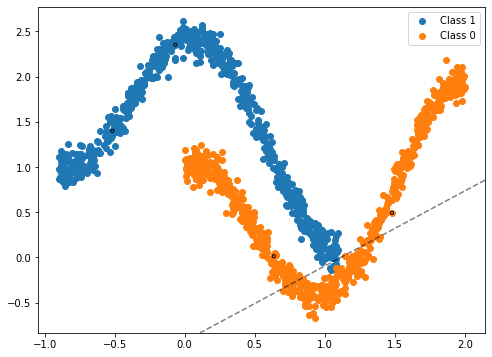

In [ ]:
nonlinear_classifier = NonLinearSVM()
X,Y       = nonlinear_classifier.train_dataset
x_batch   = X[:5]
y_batch   = Y[:5]

print("\n==>Checking Working of Build Model Function")
nonlinear_classifier.model = nonlinear_classifier.build_model(C=1e-4,kernel="linear",degree=1)
nonlinear_classifier.model.fit(x_batch,y_batch)
print("----- Running Successfull") 

print("\n==>Checking Working of Visualize Weight Function")
image_frame = nonlinear_classifier.visualize()

----
**Training And Tuning**

----
Change and Tune the provided hyperparameter values below till you achieve a very high validation accuracy ~ 99%. Refer to the __Sklearn SVC Documentation__ for details on the function and range of values for the hyperparameters given below.

(10 Points)

Training Accuracy : 0.9970149253731343 | Validation Accuracy : 1.0 


==>Decision Surface Visualization

[[-0.51340649  1.24600019]
 [ 0.64030597  0.02250795]
 [ 0.83655139 -0.27487425]
 ...
 [-0.77583269  1.1146281 ]
 [ 1.45337331  0.50811026]
 [ 1.17288333 -0.13990181]] [1. 0. 0. ... 1. 0. 0.]


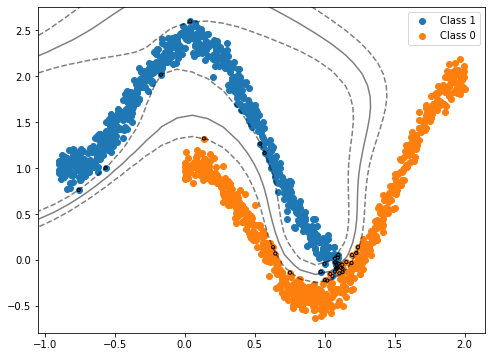

==>Observations:


        <ID> 2.1 2D TOY CLASSIFICATION - NonLinear SVM </ID> 
        ---------------------------------------------------------------
        Write Your Observations and Takeaways In the Space Below.
        (Note: Do not remove the existing content & dashed lines)
        ---------------------------------------------------------------
        <BEGIN>
        
        *C - It represents the cost associated with misclassification. 
        Higher value of C means low tolerance for incorrectly classified 
        classes. Hence, increasing C increases accuracy of trained model.

        *kernel - It is the kernel function used by SVM to train the 
        model. It takes input data and transforms it to suitable higher 
        dimensional space and returns the dot product of X and W.
        The RBF (radial basis fuction) is most commonly used for better 
        classification.

        *degree - It is used to specify the degree of polynomial if
        we use 'poly' 

In [ ]:
### BEGIN - CHANGE/TUNE THE FOLLOWING HYPERPARAMETER VALUES###

C      = 1e2
kernel = "rbf"
degree = 5

### END ###

nonlinear_classifier = NonLinearSVM(C=C,kernel=kernel,degree=degree)
nonlinear_classifier.train()
imageio.imwrite('{}/svm_nonlinear.png'.format(output_dir), nonlinear_classifier.decision_surface)
save(nonlinear_classifier,directory=output_dir)
print("==>Observations:\n")
nonlinear_classifier.print_observations()

----
**Submision Check**
---

Use the following code blocks to see if your models have been saved properly. Verify that the visualizations generated from the loaded correspond to your latest obtained outputs.

==>Loading ToyClassifier


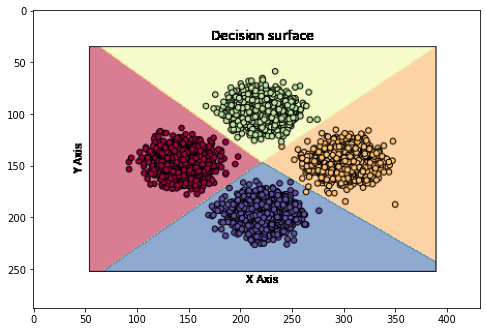

In [ ]:
print("==>Loading ToyClassifier")
with open("{}/ToyClassifier".format(output_dir),"rb") as f:
    classifier = pickle.load(f)
plt.figure(figsize=(8,6))
plt.imshow(classifier.visualize_weights())

==>Loading ImageClassifier


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

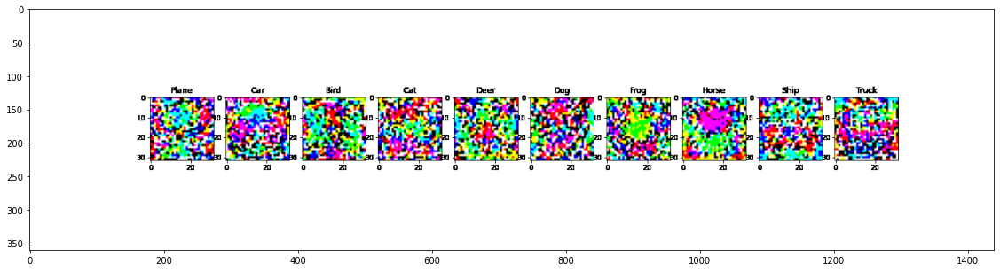

In [ ]:

print("==>Loading ImageClassifier")
with open("{}/ImageClassifier".format(output_dir),"rb") as f:
    classifier = pickle.load(f)
    classifier.dataset    = classifier.load_dataset()
    classifier.train_dataset, classifier.validation_dataset, classifier.test_dataset = classifier.split_dataset(classifier.dataset)
    plt.figure(figsize=(20,5))
    plt.imshow(classifier.visualize_weights())

==>Loading Non Linear SVM Classifier
[[-0.51340649  1.24600019]
 [ 0.64030597  0.02250795]
 [ 0.83655139 -0.27487425]
 ...
 [-0.77583269  1.1146281 ]
 [ 1.45337331  0.50811026]
 [ 1.17288333 -0.13990181]] [1. 0. 0. ... 1. 0. 0.]


<Figure size 576x360 with 0 Axes>

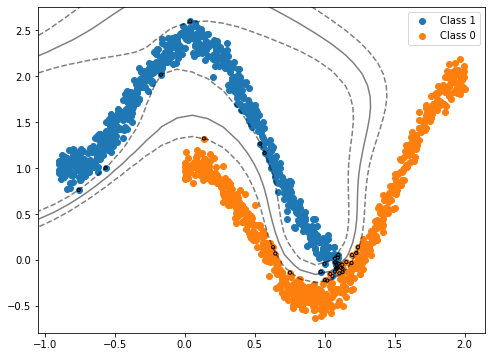

In [ ]:
print("==>Loading Non Linear SVM Classifier")
with open("{}/NonLinearSVM".format(output_dir),"rb") as f:
    classifier = pickle.load(f)
    plt.figure(figsize=(8,5))
    classifier.visualize()